In [2]:
# Importing necessary libraries
!pip install https://github.com/pandas-profiling/pandas-profiling/archive/master.zip 
!pip install category_encoders
#!pip install numba==0.53
#conda install -c conda-forge category_encoders
#!pip install category_encoders
!pip install shap

from sklearn.preprocessing import StandardScaler
import seaborn as sns
import numpy as np
import pandas as pd
import matplotlib as plt
from pandas_profiling import ProfileReport
from sklearn.compose import ColumnTransformer
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import OneHotEncoder
from xgboost import XGBClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GridSearchCV
from imblearn.pipeline import Pipeline as imbPipeline
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import KFold, StratifiedKFold
import matplotlib
from sklearn.model_selection import RandomizedSearchCV
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.ensemble import RandomForestRegressor
import category_encoders as ce
import shap

#import sys
#!{sys.executable} -m pip install -U pandas-profiling[notebook]
#!jupyter nbextension enable --py widgetsnbextension
from pandas_profiling import ProfileReport

  Using cached https://github.com/pandas-profiling/pandas-profiling/archive/master.zip


In [ ]:
#Connecting notebook to google drive 
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# Data Creating/Merging

In [4]:
#Reading the data of facilities 
#df=pd.read_csv("/content/drive/MyDrive/MDA-2022-Italy/Report/Dataset_preparation/facilities.csv")
df=pd.read_csv("facilities.csv")
#Choosing state prison and droping note column
df = df[df['facility_type']=='State prison']
df = df.drop(['facility_type', 'note'], axis=1)
df.head()

FileNotFoundError: [Errno 2] No such file or directory: '/Dataset_preparation/facilities.csv'

In [ ]:
# Reading the data we have created for state prisons by state (includes policies)
#df2=pd.read_csv("/content/drive/MyDrive/MDA-2022-Italy/Report/Dataset_preparation/Dataset.csv")
df2=pd.read_csv("Dataset.csv")
#Extracting the columns that will be used for this notebook from the dataset we have created 
col = df2.iloc[:, 1:3]
cols = df2.iloc[:, 11:61]
df2=pd.concat([col,cols], axis=1)
df2.head()

,state_code,states,avg capacity,Perc_Budget,inmate_vaccination_quarter2020Q2,inmate_vaccination_quarter2020Q3,inmate_vaccination_quarter2020Q4,inmate_vaccination_quarter2021Q1,inmate_testing_quarter2020Q2,inmate_testing_quarter2020Q3,...,staff_testing_quarter2020Q4,staff_testing_quarter2021Q1,staff_masking_quarter2020Q2,staff_masking_quarter2020Q3,staff_masking_quarter2020Q4,staff_masking_quarter2021Q1,staff_quarantine_quarter2020Q2,staff_quarantine_quarter2020Q3,staff_quarantine_quarter2020Q4,staff_quarantine_quarter2021Q1
0,AL,Alabama,112.60,1.844385,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0
1,AK,Alaska,91.65,3.265038,0.0,0.0,0.0,1.0,0.0,0.0,...,0.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0
2,AZ,Arizona,90.40,2.317528,0.0,0.0,0.0,0.0,0.0,1.0,...,0.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0
3,AR,Arkansas,88.15,1.227676,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0
4,CA,California,90.55,2.414770,0.0,0.0,0.0,1.0,0.0,0.0,...,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0


In [ ]:
#Creating an index for each policies for each states by taking the average of policy implementation quarterly
def quarterlyIndex(df):

  variables = ['inmate_vaccination_quarter', 'inmate_testing_quarter', 'inmate_testing_quarter', 'inmate_releases_quarter', 'inmate_social_distance_quarter', 'inmate_social_distance_sleep_quarter', 'inmate_screening_quarter','inmate_quarantine_quarter', 'inmate_visitation_suspended_quarter', 'staff_testing_quarter', 'staff_masking_quarter', 'staff_quarantine_quarter']
  for i in range(len(variables)):
    Sum = df[[variables[i]+'2020Q2', variables[i]+'2020Q3',variables[i]+'2020Q4', variables[i]+'2021Q1']].sum(axis=1)
    df[variables[i]+'_Index']= Sum/4
    
    
  return df
  
quarterlyIndex(df2).head()


,state_code,states,avg capacity,Perc_Budget,inmate_vaccination_quarter2020Q2,inmate_vaccination_quarter2020Q3,inmate_vaccination_quarter2020Q4,inmate_vaccination_quarter2021Q1,inmate_testing_quarter2020Q2,inmate_testing_quarter2020Q3,...,inmate_testing_quarter_Index,inmate_releases_quarter_Index,inmate_social_distance_quarter_Index,inmate_social_distance_sleep_quarter_Index,inmate_screening_quarter_Index,inmate_quarantine_quarter_Index,inmate_visitation_suspended_quarter_Index,staff_testing_quarter_Index,staff_masking_quarter_Index,staff_quarantine_quarter_Index
0,AL,Alabama,112.60,1.844385,0.0,0.0,0.0,0.0,0.0,0.0,...,0.25,0.0,0.0,0.0,1.0,1.0,0.5,0.00,1.00,1.0
1,AK,Alaska,91.65,3.265038,0.0,0.0,0.0,1.0,0.0,0.0,...,0.50,0.0,0.0,1.0,1.0,0.0,1.0,0.00,0.75,0.0
2,AZ,Arizona,90.40,2.317528,0.0,0.0,0.0,0.0,0.0,1.0,...,0.75,0.0,0.0,0.0,0.0,0.0,1.0,0.00,0.75,0.0
3,AR,Arkansas,88.15,1.227676,0.0,0.0,0.0,0.0,0.0,0.0,...,0.00,1.0,0.0,0.0,1.0,1.0,1.0,0.00,1.00,0.0
4,CA,California,90.55,2.414770,0.0,0.0,0.0,1.0,0.0,0.0,...,0.00,1.0,1.0,0.0,1.0,1.0,1.0,0.75,1.00,1.0


In [ ]:
# Choosing columns that will be merged with first dataset
col=df2.loc[:, [col for col in df2.columns if col.endswith('_Index')]]
cols=df2.iloc[:, [1,2,3]]
df2=pd.concat([cols,col], axis=1)
df3= df2.rename(columns={'states':'facility_state'})
df3.head()

,facility_state,avg capacity,Perc_Budget,inmate_vaccination_quarter_Index,inmate_testing_quarter_Index,inmate_releases_quarter_Index,inmate_social_distance_quarter_Index,inmate_social_distance_sleep_quarter_Index,inmate_screening_quarter_Index,inmate_quarantine_quarter_Index,inmate_visitation_suspended_quarter_Index,staff_testing_quarter_Index,staff_masking_quarter_Index,staff_quarantine_quarter_Index
0,Alabama,112.60,1.844385,0.00,0.25,0.0,0.0,0.0,1.0,1.0,0.5,0.00,1.00,1.0
1,Alaska,91.65,3.265038,0.25,0.50,0.0,0.0,1.0,1.0,0.0,1.0,0.00,0.75,0.0
2,Arizona,90.40,2.317528,0.00,0.75,0.0,0.0,0.0,0.0,0.0,1.0,0.00,0.75,0.0
3,Arkansas,88.15,1.227676,0.00,0.00,1.0,0.0,0.0,1.0,1.0,1.0,0.00,1.00,0.0
4,California,90.55,2.414770,0.25,0.00,1.0,1.0,0.0,1.0,1.0,1.0,0.75,1.00,1.0


In [ ]:
# merging dataset 1 and 2 
data = pd.merge(df, df3)
#Dropping id columns
data= data.drop(['nyt_id', 'facility_name'], axis=1)
data.head()

,facility_city,facility_county,facility_county_fips,facility_state,facility_lng,facility_lat,latest_inmate_population,max_inmate_population_2020,total_inmate_cases,total_inmate_deaths,...,inmate_testing_quarter_Index,inmate_releases_quarter_Index,inmate_social_distance_quarter_Index,inmate_social_distance_sleep_quarter_Index,inmate_screening_quarter_Index,inmate_quarantine_quarter_Index,inmate_visitation_suspended_quarter_Index,staff_testing_quarter_Index,staff_masking_quarter_Index,staff_quarantine_quarter_Index
0,Brent,Bibb,1007,Alabama,-87.162781,32.920754,1725.0,1825.0,164,3,...,0.25,0.0,0.0,0.0,1.0,1.0,0.5,0.0,1.0,1.0
1,Birmingham,Jefferson,1073,Alabama,-86.808344,33.531101,192.0,NaN,17,0,...,0.25,0.0,0.0,0.0,1.0,1.0,0.5,0.0,1.0,1.0
2,Bessemer,Bullock,1011,Alabama,-85.673927,32.147144,1477.0,1577.0,162,5,...,0.25,0.0,0.0,0.0,1.0,1.0,0.5,0.0,1.0,1.0
3,Camden,Wilcox,1131,Alabama,-87.287859,31.987811,49.0,NaN,5,0,...,0.25,0.0,0.0,0.0,1.0,1.0,0.5,0.0,1.0,1.0
4,Childersburg,Talladega,1121,Alabama,-86.353001,33.277633,322.0,NaN,5,0,...,0.25,0.0,0.0,0.0,1.0,1.0,0.5,0.0,1.0,1.0


# EDA

In [ ]:
#Profile reporting is applied for exploratory Data Analysis 
report = ProfileReport(data, minimal=True)
report

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [ ]:
report = ProfileReport(data, minimal=True)

print(repr(report.report))

report.to_widgets()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Root


Ipywidgets is not yet fully supported on Google Colab (https://github.com/googlecolab/colabtools/issues/60).As an alternative, you can use the HTML report. See the documentation for more information.


Render widgets:   0%|          | 0/1 [00:00<?, ?it/s]

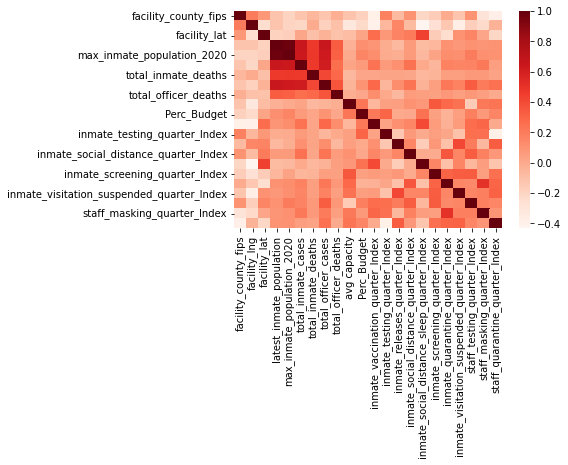

In [ ]:
corr = data.corr()
sns.heatmap(corr, cmap="Reds")

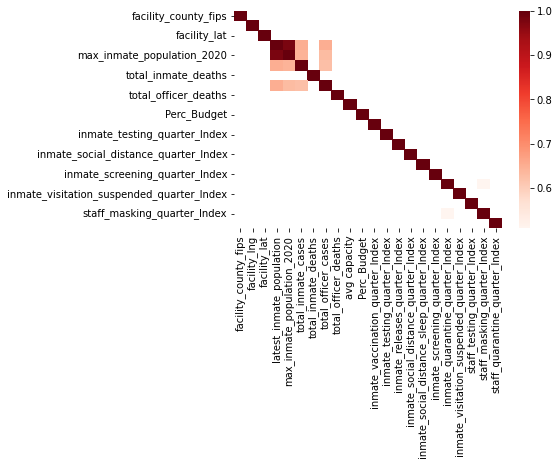

In [ ]:
corr = data.corr()
kot = corr[corr>=.5]
sns.heatmap(kot, cmap="Reds")

# Data Preprocessing

In [ ]:
#Dropping the column with 30% missing values (also highly correlated (>80%) with latest_inmate_population) 
data= data.drop(['max_inmate_population_2020'],axis=1)
data.head()

,facility_city,facility_county,facility_county_fips,facility_state,facility_lng,facility_lat,latest_inmate_population,total_inmate_cases,total_inmate_deaths,total_officer_cases,...,inmate_testing_quarter_Index,inmate_releases_quarter_Index,inmate_social_distance_quarter_Index,inmate_social_distance_sleep_quarter_Index,inmate_screening_quarter_Index,inmate_quarantine_quarter_Index,inmate_visitation_suspended_quarter_Index,staff_testing_quarter_Index,staff_masking_quarter_Index,staff_quarantine_quarter_Index
0,Brent,Bibb,1007,Alabama,-87.162781,32.920754,1725.0,164,3,61,...,0.25,0.0,0.0,0.0,1.0,1.0,0.5,0.0,1.0,1.0
1,Birmingham,Jefferson,1073,Alabama,-86.808344,33.531101,192.0,17,0,28,...,0.25,0.0,0.0,0.0,1.0,1.0,0.5,0.0,1.0,1.0
2,Bessemer,Bullock,1011,Alabama,-85.673927,32.147144,1477.0,162,5,80,...,0.25,0.0,0.0,0.0,1.0,1.0,0.5,0.0,1.0,1.0
3,Camden,Wilcox,1131,Alabama,-87.287859,31.987811,49.0,5,0,3,...,0.25,0.0,0.0,0.0,1.0,1.0,0.5,0.0,1.0,1.0
4,Childersburg,Talladega,1121,Alabama,-86.353001,33.277633,322.0,5,0,14,...,0.25,0.0,0.0,0.0,1.0,1.0,0.5,0.0,1.0,1.0


# Pipeline

In [ ]:
# Creating column transformer for both numerical and categorical variables
#For categorical variable target encoding (using mean) is used 
#For numerical variable imputation with mean and minmaxscaler  
numeric_features = ['facility_county_fips', 'facility_lng',
       'facility_lat', 'latest_inmate_population', 'total_inmate_deaths',
       'total_officer_cases', 'total_officer_deaths', 'avg capacity',
       'Perc_Budget', 'inmate_vaccination_quarter_Index',
       'inmate_testing_quarter_Index', 'inmate_releases_quarter_Index',
       'inmate_social_distance_quarter_Index',
       'inmate_social_distance_sleep_quarter_Index',
       'inmate_screening_quarter_Index', 'inmate_quarantine_quarter_Index',
       'inmate_visitation_suspended_quarter_Index',
       'staff_testing_quarter_Index', 'staff_masking_quarter_Index',
       'staff_quarantine_quarter_Index']
numeric_transformer = Pipeline(
    steps=[("imputer", SimpleImputer(strategy="median")), ("scaler", MinMaxScaler())]
)

categorical_features = ['facility_city','facility_county','facility_state']
categorical_transformer = ce.target_encoder.TargetEncoder()

preprocessor = ColumnTransformer(
    transformers=[
                  ("cat", categorical_transformer, categorical_features),
                  ("num", numeric_transformer, numeric_features)
        ,
    ]
)



Default parameter min_samples_leaf will change in version 2.6.See https://github.com/scikit-learn-contrib/category_encoders/issues/327
Default parameter smoothing will change in version 2.6.See https://github.com/scikit-learn-contrib/category_encoders/issues/327


In [ ]:
#Creating variable and target dataset
dataX= data.drop(['total_inmate_cases'], axis=1)
dataY=data[['total_inmate_cases']]
#miss=data['latest_inmate_popualtion'].isnull()
#miss

In [ ]:
#Creating pipeline for preprocess and RandomForest 
pipeline= Pipeline(
    steps=[("preprocessor",preprocessor), 
           ("model", RandomForestRegressor(n_estimators = 1000, random_state = 42))
           ])

In [ ]:
#Creating preprocessing pipeline for SHAP values
pipelineShap= Pipeline(
    steps=[("preprocessor",preprocessor)
           ])

# RandomForest Parameter

In [ ]:
# Defining different parameters for RandomForest model  
param_grid_mod3 = [
 
    { 'model__max_depth': [8, 10, 15],
 'model__max_features': ['sqrt', 'log2'],
 'model__min_samples_leaf': [2, 3, 4],
 'model__min_samples_split': [2, 3, 4],
 'model__n_estimators': [400, 500, 600]
         } 
]

In [ ]:
# 10-fold cross validation grid search for GradientBoosting 
cv = StratifiedKFold (n_splits=10, shuffle=True, random_state=10)
# 10-fold cross validation grid search for RandomForest 
gridsearch_mod = GridSearchCV(pipeline, param_grid_mod3, cv = cv , scoring= 'neg_mean_squared_error').fit(dataX, dataY)
#Best training parameters for RandomForest
gridsearch_mod.best_params_

Streaming output truncated to the last 5000 lines.
Default parameter smoothing will change in version 2.6.See https://github.com/scikit-learn-contrib/category_encoders/issues/327
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
Default parameter min_samples_leaf will change in version 2.6.See https://github.com/scikit-learn-contrib/category_encoders/issues/327
Default parameter smoothing will change in version 2.6.See https://github.com/scikit-learn-contrib/category_encoders/issues/327
Default parameter min_samples_leaf will change in version 2.6.See https://github.com/scikit-learn-contrib/category_encoders/issues/327
Default parameter smoothing will change in version 2.6.See https://github.com/scikit-learn-contrib/category_encoders/issues/327
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
Default parameter min_samples_l

{'model__max_depth': 15,
 'model__max_features': 'sqrt',
 'model__min_samples_leaf': 2,
 'model__min_samples_split': 2,
 'model__n_estimators': 600}

In [ ]:
#Best training result with RandomForest
gridsearch_mod.best_score_

-66971.69920713498

In [ ]:
gridsearch_mod.best_params_

{'model__max_depth': 15,
 'model__max_features': 'sqrt',
 'model__min_samples_leaf': 2,
 'model__min_samples_split': 2,
 'model__n_estimators': 600}

# SHAP

In [ ]:
#Creating dataX again with preprocess pipeline for SHAP values 
dataXX = pd.DataFrame(pipelineShap.fit_transform(dataX, dataY))
dataXX.columns = ['facility_city','facility_county','facility_state', 'facility_county_fips', 'facility_lng',
       'facility_lat', 'latest_inmate_population', 'total_inmate_deaths',
       'total_officer_cases', 'total_officer_deaths', 'avg capacity',
       'Perc_Budget', 'inmate_vaccination_quarter_Index',
       'inmate_testing_quarter_Index', 'inmate_releases_quarter_Index',
       'inmate_social_distance_quarter_Index',
       'inmate_social_distance_sleep_quarter_Index',
       'inmate_screening_quarter_Index', 'inmate_quarantine_quarter_Index',
       'inmate_visitation_suspended_quarter_Index',
       'staff_testing_quarter_Index', 'staff_masking_quarter_Index',
       'staff_quarantine_quarter_Index']
dataXX

Default parameter min_samples_leaf will change in version 2.6.See https://github.com/scikit-learn-contrib/category_encoders/issues/327
Default parameter smoothing will change in version 2.6.See https://github.com/scikit-learn-contrib/category_encoders/issues/327


,facility_city,facility_county,facility_state,facility_county_fips,facility_lng,facility_lat,latest_inmate_population,total_inmate_deaths,total_officer_cases,total_officer_deaths,...,inmate_testing_quarter_Index,inmate_releases_quarter_Index,inmate_social_distance_quarter_Index,inmate_social_distance_sleep_quarter_Index,inmate_screening_quarter_Index,inmate_quarantine_quarter_Index,inmate_visitation_suspended_quarter_Index,staff_testing_quarter_Index,staff_masking_quarter_Index,staff_quarantine_quarter_Index
0,306.604108,98.203901,59.541667,0.000073,0.798341,0.292632,0.317001,0.085714,0.082993,0.00,...,0.25,0.0,0.0,0.0,1.00,1.0,0.333333,0.00,1.0,1.0
1,306.604108,204.272727,59.541667,0.001272,0.801957,0.306161,0.034629,0.000000,0.038095,0.00,...,0.25,0.0,0.0,0.0,1.00,1.0,0.333333,0.00,1.0,1.0
2,158.123108,306.604108,59.541667,0.000145,0.813531,0.275485,0.271321,0.142857,0.108844,0.25,...,0.25,0.0,0.0,0.0,1.00,1.0,0.333333,0.00,1.0,1.0
3,306.604108,110.238771,59.541667,0.002325,0.797065,0.271953,0.008289,0.000000,0.004082,0.00,...,0.25,0.0,0.0,0.0,1.00,1.0,0.333333,0.00,1.0,1.0
4,306.604108,306.604108,59.541667,0.002144,0.806603,0.300543,0.058574,0.000000,0.019048,0.00,...,0.25,0.0,0.0,0.0,1.00,1.0,0.333333,0.00,1.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1066,306.604108,306.604108,178.152670,0.999673,0.621794,0.510900,0.043102,0.000000,0.023129,0.00,...,0.25,0.0,1.0,0.0,0.75,0.0,1.000000,0.75,1.0,0.0
1067,306.604108,306.604108,178.152670,1.000000,0.624654,0.535559,0.038497,0.000000,0.047619,0.00,...,0.25,0.0,1.0,0.0,0.75,0.0,1.000000,0.75,1.0,0.0
1068,306.604108,329.978685,178.152670,0.999419,0.581923,0.517137,0.037023,0.000000,0.046259,0.00,...,0.25,0.0,1.0,0.0,0.75,0.0,1.000000,0.75,1.0,0.0
1069,306.604108,306.604108,178.152670,0.999455,0.625345,0.495485,0.106649,0.000000,0.130612,0.00,...,0.25,0.0,1.0,0.0,0.75,0.0,1.000000,0.75,1.0,0.0


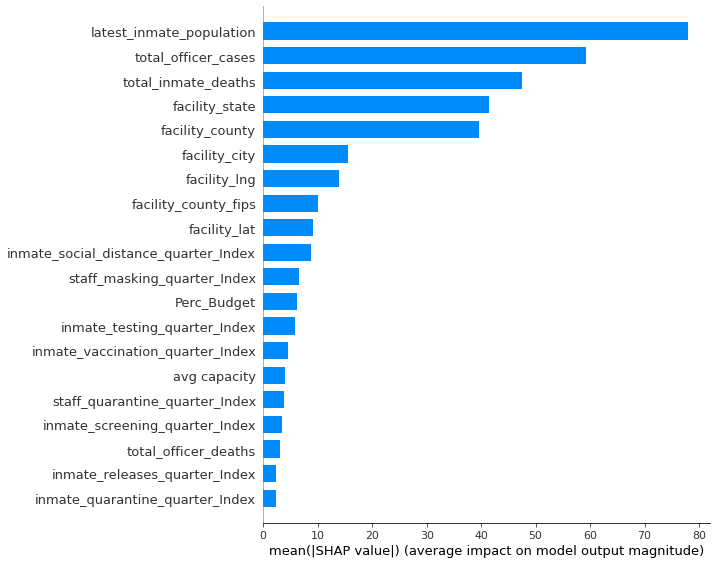

In [ ]:
# fit the model 
best_model = gridsearch_mod.best_estimator_['model']
# calculate the Shap values
shap_values = shap.Explainer(best_model).shap_values(dataXX)
# plot the Shap values (bar plot)
shap.summary_plot(shap_values, dataXX, plot_type='bar')

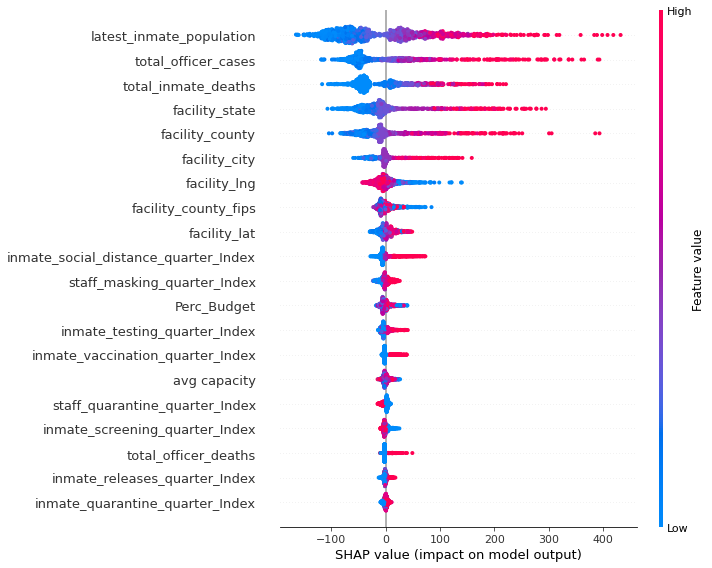

In [ ]:
# plot the Shap values (beeswarm)
shap.summary_plot(shap_values, dataXX)

# Gradient Boosting 

In [ ]:
#Creating pipeline for preprocess and RandomForest 
pipeline2= Pipeline(
    steps=[("preprocessor",preprocessor), 
           ("model",  GradientBoostingRegressor(random_state=10))
           ])

In [ ]:
#Hyperparameters for Gradient Boosting
n_estimators = [100,300,500,800,1000 ]
max_depth = [ 3,5,7,9 ]
min_samples_split = [5,10, 15 ]
min_samples_leaf = [1,2,5 ]
max_features = [ 'sqrt','log2' ]

param_grid_mod2 = [
    { 
    'model__n_estimators': n_estimators ,
    'model__max_depth': max_depth,
    'model__min_samples_split': min_samples_split,
    'model__min_samples_leaf': min_samples_leaf,
    'model__max_features': max_features
    } 
]

In [ ]:
# 10-fold cross validation grid search for GradientBoosting 
cv = StratifiedKFold (n_splits=10, shuffle=True, random_state=10)
#Best training result with GradientBoosting
gridsearch_mod2 = GridSearchCV(pipeline2, param_grid_mod2, cv = cv , scoring= 'neg_mean_squared_error').fit(dataX , dataY)
gridsearch_mod2.best_score_

Streaming output truncated to the last 5000 lines.
Default parameter smoothing will change in version 2.6.See https://github.com/scikit-learn-contrib/category_encoders/issues/327
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
Default parameter min_samples_leaf will change in version 2.6.See https://github.com/scikit-learn-contrib/category_encoders/issues/327
Default parameter smoothing will change in version 2.6.See https://github.com/scikit-learn-contrib/category_encoders/issues/327
Default parameter min_samples_leaf will change in version 2.6.See https://github.com/scikit-learn-contrib/category_encoders/issues/327
Default parameter smoothing will change in version 2.6.See https://github.com/scikit-learn-contrib/category_encoders/issues/327
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
Default parameter min_samples

-64410.178899949475

In [27]:
#Best training result with GradientBoosting
gridsearch_mod.best_score_

-66971.69920713498

In [28]:
gridsearch_mod.best_params_

{'model__max_depth': 15,
 'model__max_features': 'sqrt',
 'model__min_samples_leaf': 2,
 'model__min_samples_split': 2,
 'model__n_estimators': 600}

# Shap for GradientBoosting

In [29]:
#Creating dataX again with preprocess pipeline for SHAP values 
dataXX = pd.DataFrame(pipelineShap.fit_transform(dataX, dataY))
dataXX.columns = ['facility_city','facility_county','facility_state', 'facility_county_fips', 'facility_lng',
       'facility_lat', 'latest_inmate_population', 'total_inmate_deaths',
       'total_officer_cases', 'total_officer_deaths', 'avg capacity',
       'Perc_Budget', 'inmate_vaccination_quarter_Index',
       'inmate_testing_quarter_Index', 'inmate_releases_quarter_Index',
       'inmate_social_distance_quarter_Index',
       'inmate_social_distance_sleep_quarter_Index',
       'inmate_screening_quarter_Index', 'inmate_quarantine_quarter_Index',
       'inmate_visitation_suspended_quarter_Index',
       'staff_testing_quarter_Index', 'staff_masking_quarter_Index',
       'staff_quarantine_quarter_Index']
dataXX

Default parameter min_samples_leaf will change in version 2.6.See https://github.com/scikit-learn-contrib/category_encoders/issues/327
Default parameter smoothing will change in version 2.6.See https://github.com/scikit-learn-contrib/category_encoders/issues/327


,facility_city,facility_county,facility_state,facility_county_fips,facility_lng,facility_lat,latest_inmate_population,total_inmate_deaths,total_officer_cases,total_officer_deaths,...,inmate_testing_quarter_Index,inmate_releases_quarter_Index,inmate_social_distance_quarter_Index,inmate_social_distance_sleep_quarter_Index,inmate_screening_quarter_Index,inmate_quarantine_quarter_Index,inmate_visitation_suspended_quarter_Index,staff_testing_quarter_Index,staff_masking_quarter_Index,staff_quarantine_quarter_Index
0,306.604108,98.203901,59.541667,0.000073,0.798341,0.292632,0.317001,0.085714,0.082993,0.00,...,0.25,0.0,0.0,0.0,1.00,1.0,0.333333,0.00,1.0,1.0
1,306.604108,204.272727,59.541667,0.001272,0.801957,0.306161,0.034629,0.000000,0.038095,0.00,...,0.25,0.0,0.0,0.0,1.00,1.0,0.333333,0.00,1.0,1.0
2,158.123108,306.604108,59.541667,0.000145,0.813531,0.275485,0.271321,0.142857,0.108844,0.25,...,0.25,0.0,0.0,0.0,1.00,1.0,0.333333,0.00,1.0,1.0
3,306.604108,110.238771,59.541667,0.002325,0.797065,0.271953,0.008289,0.000000,0.004082,0.00,...,0.25,0.0,0.0,0.0,1.00,1.0,0.333333,0.00,1.0,1.0
4,306.604108,306.604108,59.541667,0.002144,0.806603,0.300543,0.058574,0.000000,0.019048,0.00,...,0.25,0.0,0.0,0.0,1.00,1.0,0.333333,0.00,1.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1066,306.604108,306.604108,178.152670,0.999673,0.621794,0.510900,0.043102,0.000000,0.023129,0.00,...,0.25,0.0,1.0,0.0,0.75,0.0,1.000000,0.75,1.0,0.0
1067,306.604108,306.604108,178.152670,1.000000,0.624654,0.535559,0.038497,0.000000,0.047619,0.00,...,0.25,0.0,1.0,0.0,0.75,0.0,1.000000,0.75,1.0,0.0
1068,306.604108,329.978685,178.152670,0.999419,0.581923,0.517137,0.037023,0.000000,0.046259,0.00,...,0.25,0.0,1.0,0.0,0.75,0.0,1.000000,0.75,1.0,0.0
1069,306.604108,306.604108,178.152670,0.999455,0.625345,0.495485,0.106649,0.000000,0.130612,0.00,...,0.25,0.0,1.0,0.0,0.75,0.0,1.000000,0.75,1.0,0.0


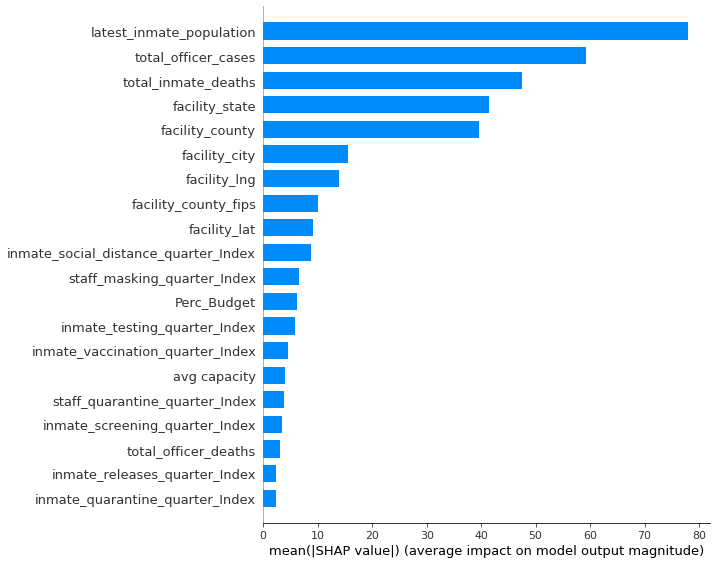

In [30]:
# fit the model 
best_model = gridsearch_mod.best_estimator_['model']
# calculate the Shap values
shap_values = shap.Explainer(best_model).shap_values(dataXX)
# plot the Shap values (bar plot)
shap.summary_plot(shap_values, dataXX, plot_type='bar')

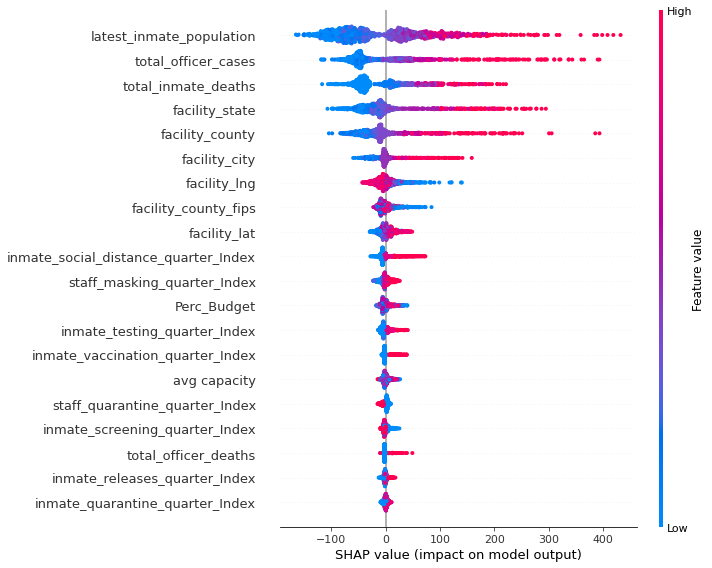

In [31]:
# plot the Shap values (beeswarm)
shap.summary_plot(shap_values, dataXX)